In [4]:
import pandas as pd; pd.options.mode.chained_assignment = None
import numpy as np
import json

# Built In Imports
from datetime import datetime
from glob import glob
import warnings
import IPython
import urllib
import zipfile
import pickle
import shutil
import string
import math
import tqdm
import time
import os
import gc
import re

# Visualization Imports
from matplotlib.colors import ListedColormap
import matplotlib.patches as patches
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
from PIL import Image
import matplotlib
import plotly
import PIL
import cv2
from pycocotools.coco import COCO

# Other Imports
from tqdm.notebook import tqdm

In [5]:
# train.json 파일을 읽어 데이터 프레임으로 만들기 
root = "../../dataset/"

with open(root + "train.json") as f:
    train = json.load(f)

categories = pd.DataFrame(train['categories'])
ann_df = pd.DataFrame(train['annotations'])
img_df = pd.DataFrame(train['images'])

# annotation 데이터 프레임에 image_id를 기준으로 file_name을 추가하기
ann_df['file_name'] = ann_df['image_id'].map(img_df['file_name'])

In [6]:
train.keys()

dict_keys(['info', 'licenses', 'images', 'categories', 'annotations'])

In [7]:
# images 정보
train['images'][0].keys()

dict_keys(['width', 'height', 'file_name', 'license', 'flickr_url', 'coco_url', 'date_captured', 'id'])

In [8]:
# annotations 정보
train['annotations'][0].keys()

dict_keys(['image_id', 'category_id', 'area', 'bbox', 'iscrowd', 'id'])

In [9]:
print('{}개의 image'.format(len(train['images'])))
print('{}개의 category'.format(len(train['categories'])))
print('{}개의 annotation'.format(len(train['annotations'])))

4883개의 image
10개의 category
23144개의 annotation


In [10]:
class_name = categories['name'].unique()
print(f'쓰레기 종류: {class_name}')

쓰레기 종류: ['General trash' 'Paper' 'Paper pack' 'Metal' 'Glass' 'Plastic'
 'Styrofoam' 'Plastic bag' 'Battery' 'Clothing']


In [11]:
ann_df.head(10)

,image_id,category_id,area,bbox,iscrowd,id,file_name
0,0,0,257301.66,"[197.6, 193.7, 547.8, 469.7]",0,0,train/0000.jpg
1,1,3,10402.56,"[0.0, 407.4, 57.6, 180.6]",0,1,train/0001.jpg
2,1,7,26259.36,"[0.0, 455.6, 144.6, 181.6]",0,2,train/0001.jpg
3,1,4,69096.17,"[722.3, 313.4, 274.3, 251.9]",0,3,train/0001.jpg
4,1,5,24164.58,"[353.2, 671.0, 233.7, 103.4]",0,4,train/0001.jpg
5,1,5,188324.40,"[3.7, 448.5, 778.2, 242.0]",0,5,train/0001.jpg
6,1,0,38908.72,"[425.3, 681.9, 216.4, 179.8]",0,6,train/0001.jpg
7,1,7,7391.52,"[92.4, 601.7, 139.2, 53.1]",0,7,train/0001.jpg
8,1,0,6857.76,"[622.4, 686.5, 72.8, 94.2]",0,8,train/0001.jpg
9,2,3,324010.80,"[267.9, 165.2, 631.6, 513.0]",0,9,train/0002.jpg


In [12]:
# 각 이미지별로 몇개의 bbox가 있는지 확인
ann_df['image_id'].value_counts().describe()

count    4883.000000
mean        4.739709
std         6.355155
min         1.000000
25%         1.000000
50%         2.000000
75%         6.000000
max        71.000000
Name: image_id, dtype: float64

In [13]:
# 각 카테고리별로 몇개의 bbox가 있는지 확인
ann_df['category_id'].value_counts()

1    6352
7    5178
0    3966
5    2943
6    1263
4     982
3     936
2     897
9     468
8     159
Name: category_id, dtype: int64

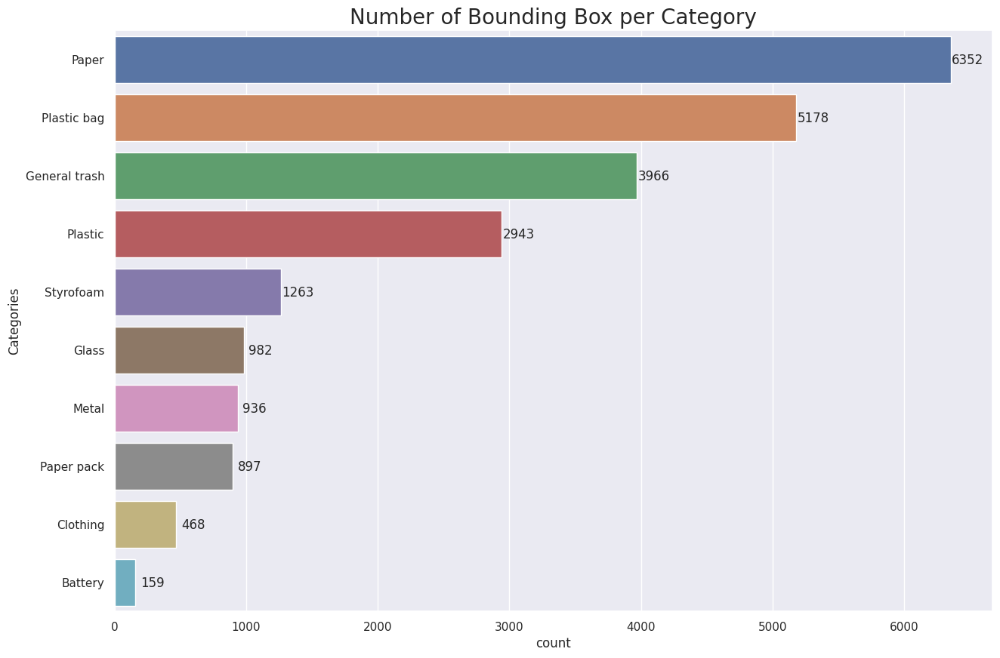

In [14]:
# 각 카테고리별로 몇개의 bbox가 있는지 시각화
sns.set(rc={'figure.figsize':(15,10)})
ctgr_bbox_df = pd.concat([ann_df['image_id'], ann_df['category_id']], axis=1)

ctgr_bbox_df['Categories'] = ctgr_bbox_df['category_id'].map(categories['name'])

bat_plot = sns.countplot(y='Categories', 
                         data=ctgr_bbox_df, 
                         order=ctgr_bbox_df['Categories'].value_counts().index)
bat_plot.set_title('Number of Bounding Box per Category', fontsize=20)

for i, p in enumerate(bat_plot.patches):
    bat_plot.annotate(ctgr_bbox_df['Categories'].value_counts()[i], 
                      (p.get_x()+p.get_width()+50, p.get_y()+0.6), 
                      ha='center', 
                      va='center', 
                      xytext=(10, 10), 
                      textcoords='offset points')

In [15]:
from PIL import Image, ImageDraw

In [16]:
# 제일 큰 bbox와 제일 작은 bbox, 그리고 평균 bbox의 크기를 확인
print(f'max area: {ann_df.area.max()} \
      \nmin area: {ann_df.area.min()} \
      \nmean area: {ann_df.area.mean()}\n')

max area: 1048371.21       
min area: 0.56       
mean area: 92863.95783831662



In [17]:
# 제일 큰 bbox와 제일 작은 bbox를 가진 이미지의 정보
ann_df[ann_df['area'].isin([ann_df.area.max(), ann_df.area.min()])]

,image_id,category_id,area,bbox,iscrowd,id,file_name
5159,1063,0,0.56,"[647.8, 460.2, 0.7, 0.8]",0,5159,train/1063.jpg
5565,1160,7,1048371.21,"[0.0, 0.0, 1023.9, 1023.9]",0,5565,train/1160.jpg


In [18]:
# bbox를 그리기 위한 색 리스트
# General trash, Paper, Paper pack, Metal, Glass, Plastic, Styrofoam, Plastic bag, Battery, Clothing
colors = ['yellow', 'blue', 'green', 'red', 'orange', 'magenta', 'pink', 'cyan', 'gray', 'olive']

In [20]:
def draw_bbox(img_id, lt = 500, gt = 1000000, all = False,):
    '''
    img_id: 이미지 id
    lt: 크기가 lt이하인 bbox 그리기
    gt: 크기가 gt이상인 bbox 그리기
    all: True일 경우 모든 bbox를 그리고 False일 경우 lt와 gt에 해당하는 bbox만 그리기
    '''

    img = Image.open(root + ann_df[ann_df['image_id'] == img_id]['file_name'].values[0])
    draw_df = ann_df[ann_df['image_id'] == img_id].drop(['image_id', 'id', 'iscrowd', 'file_name'], axis=1)

    print(f"\n{img_id}번 이미지 category별로 bbox개수 확인\n", draw_df.groupby('category_id').count())

    # 제일 작은 박스가 위로 오도록 정렬
    draw_df.sort_values(by='bbox', inplace=True)    

    for i, (category, (x_min, y_min, w, h)) in enumerate(zip(draw_df['category_id'], draw_df['bbox'])):
        if all: # 모든 bbox를 그리기
            draw = ImageDraw.Draw(img, "RGBA")
            draw.rectangle([(x_min, y_min), 
                            (x_min+w, y_min+h)], 
                            outline=colors[category], 
                            width=3,
                            fill=(0, 0, 0, 50))
        elif draw_df['area'].values[i] <= lt or draw_df['area'].values[i] >= gt: # bbox의 크기가 lt보다 작거나 gt보다 큰 경우만 그리기
            draw = ImageDraw.Draw(img, "RGBA")
            draw.rectangle([(x_min, y_min), 
                            (x_min+w, y_min+h)], 
                            outline=colors[category], 
                            width=3,
                            fill=(0, 0, 0, 50))
    img.show(img)


1063번 이미지 category별로 bbox개수 확인
              area  bbox
category_id            
0               2     2
1               3     3
2               2     2
3               1     1
5               9     9
7               9     9


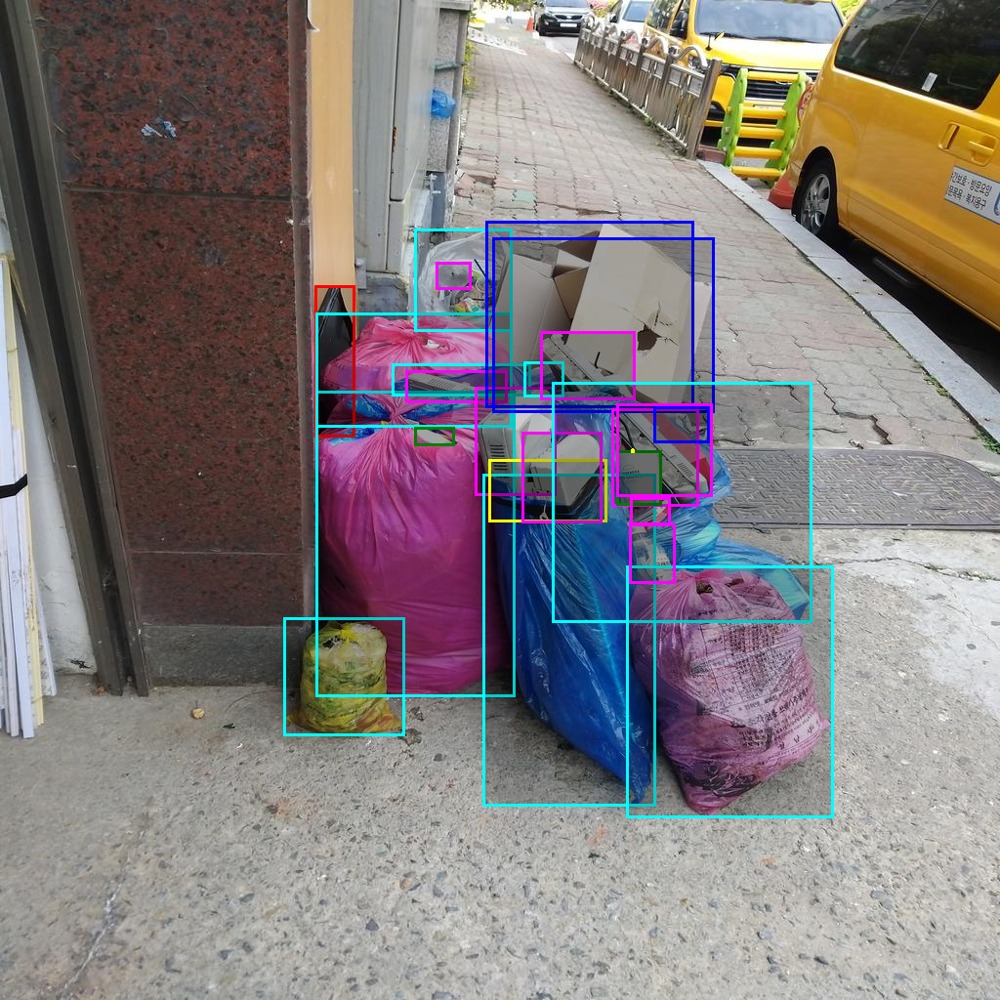


1160번 이미지 category별로 bbox개수 확인
              area  bbox
category_id            
0               1     1
7               4     4


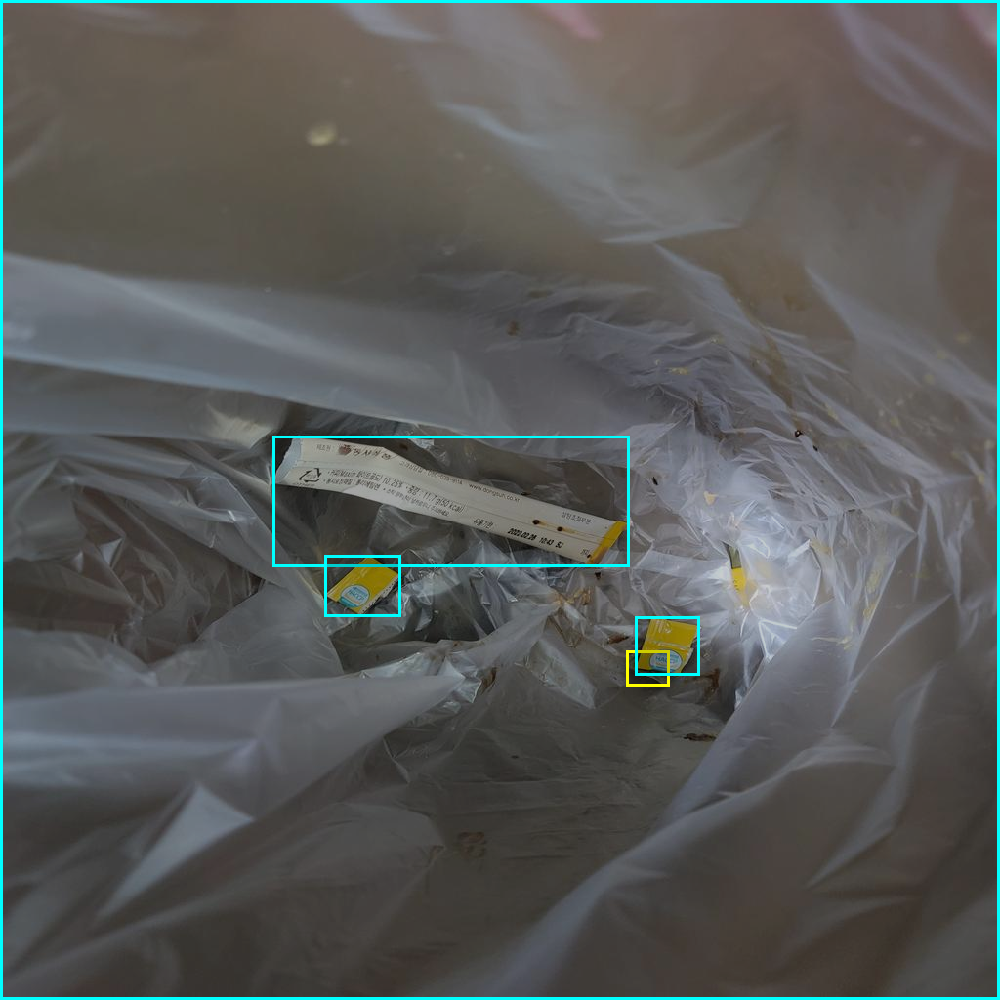

In [21]:
# 제일 작은 bbox를 가진 이미지와 제일 큰 bbox를 가진 이미지를 bbox를 함께 시각화
for idx in [1063, 1160]:
    draw_bbox(idx, 500, 1000000, True)

In [22]:
# bbox의 크기가 500보다 작은 이미지들의 정보
ann_df[ann_df['area'] < 500].sort_values(by='area')

,image_id,category_id,area,bbox,iscrowd,id,file_name
5159,1063,0,0.56,"[647.8, 460.2, 0.7, 0.8]",0,5159,train/1063.jpg
6539,1377,1,3.12,"[719.8, 604.7, 1.3, 2.4]",0,6539,train/1377.jpg
17594,3712,2,66.25,"[883.8, 638.5, 12.5, 5.3]",0,17594,train/3712.jpg
5067,1056,5,105.08,"[530.6, 70.9, 14.2, 7.4]",0,5067,train/1056.jpg
7227,1521,3,275.12,"[728.4, 307.8, 36.2, 7.6]",0,7227,train/1521.jpg
12473,2630,7,301.71,"[570.2, 822.5, 8.9, 33.9]",0,12473,train/2630.jpg
17780,3756,0,318.16,"[749.0, 282.4, 9.7, 32.8]",0,17780,train/3756.jpg
4813,1002,5,324.36,"[0.0, 35.6, 10.2, 31.8]",0,4813,train/1002.jpg
18091,3817,1,347.70,"[721.0, 816.1, 18.3, 19.0]",0,18091,train/3817.jpg
760,160,0,350.00,"[633.2, 694.1, 20.0, 17.5]",0,760,train/0160.jpg



1377번 이미지 category별로 bbox개수 확인
              area  bbox
category_id            
0               1     1
1               1     1
7               3     3


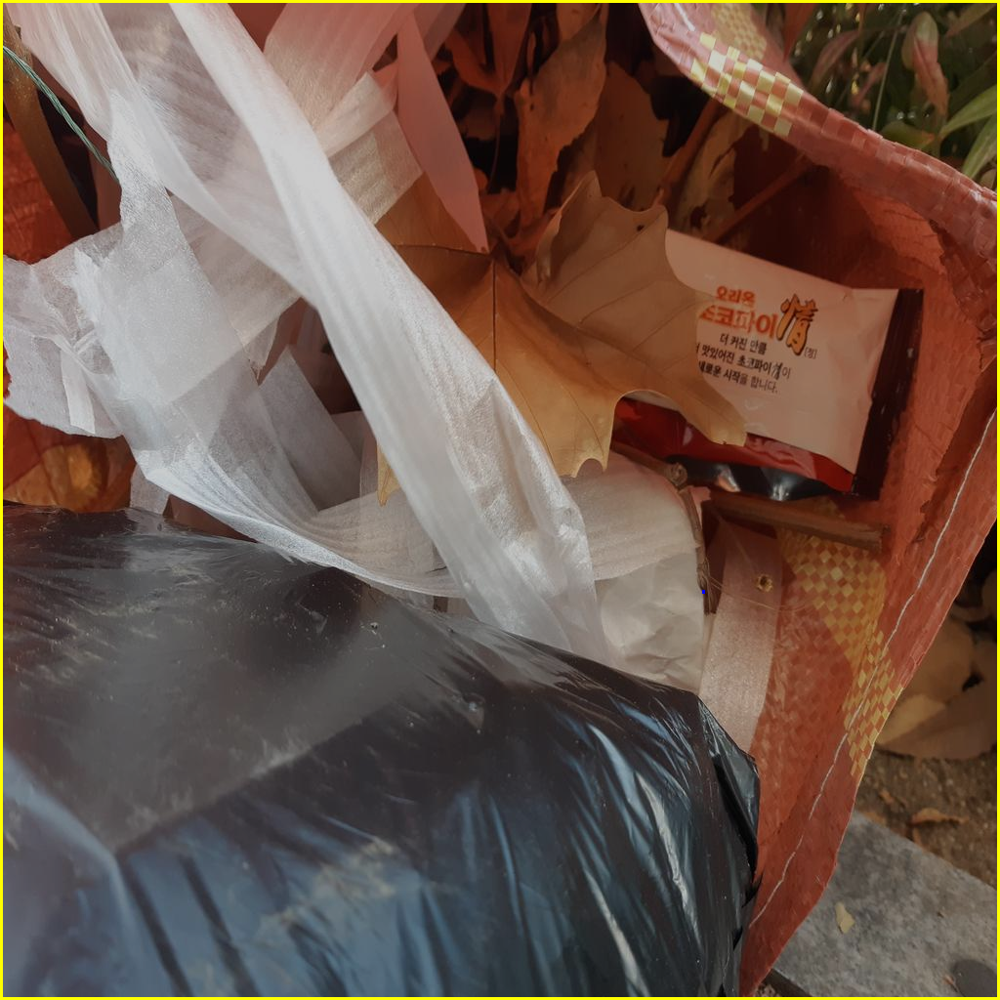

In [23]:
# area가 3.12인 bbox를 가진 이미지 시각화
draw_bbox(1377, 500, 1000000)


3712번 이미지 category별로 bbox개수 확인
              area  bbox
category_id            
0               1     1
2               2     2
6               2     2
7               5     5


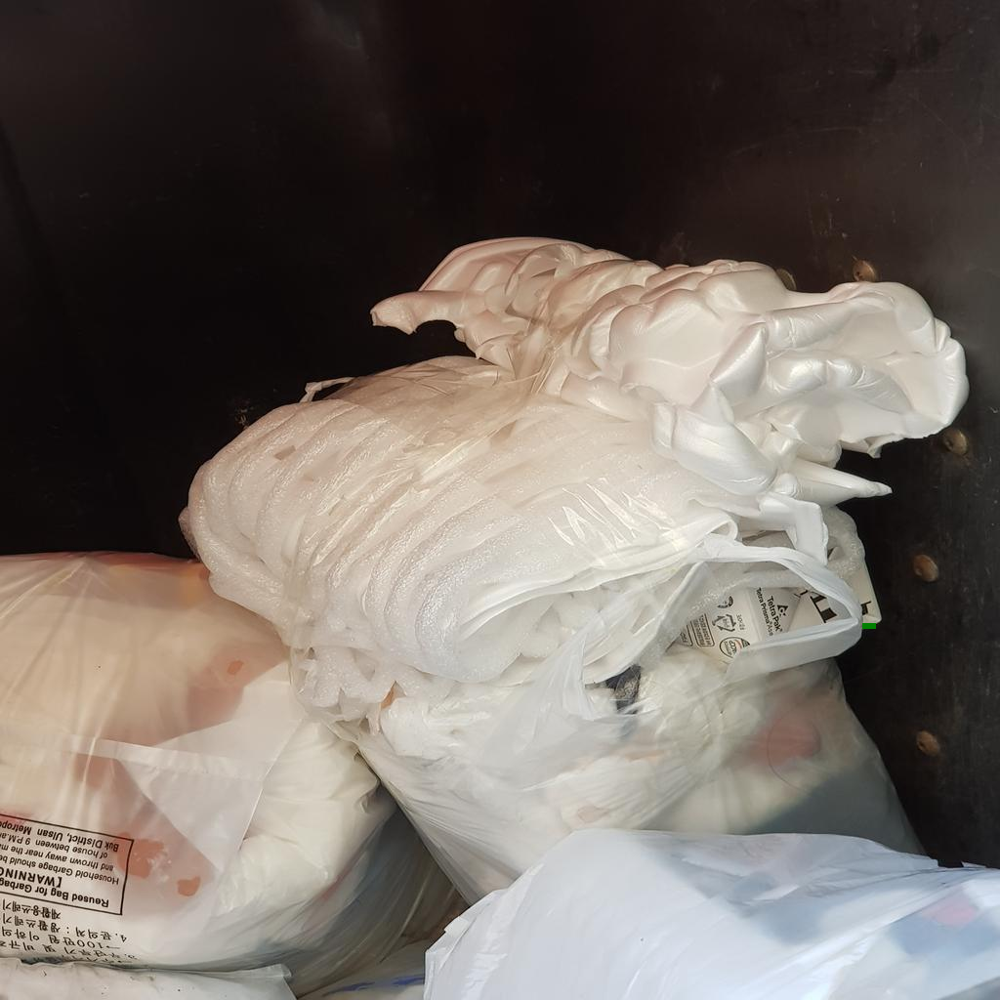

In [24]:
# area가 66.25인 bbox를 가진 이미지 시각화
draw_bbox(3712, 500, 1000000)

In [25]:
# bbox의 크기가 1000,000보다 큰 이미지들의 정보
ann_df[ann_df['area'] > 1000000].sort_values(by='area', ascending=False)

,image_id,category_id,area,bbox,iscrowd,id,file_name
5565,1160,7,1048371.21,"[0.0, 0.0, 1023.9, 1023.9]",0,5565,train/1160.jpg
4272,901,7,1048064.06,"[0.0, 0.0, 1023.7, 1023.8]",0,4272,train/0901.jpg
6537,1377,0,1048064.06,"[0.0, 0.0, 1023.8, 1023.7]",0,6537,train/1377.jpg
15633,3289,1,1048064.06,"[0.0, 0.0, 1023.8, 1023.7]",0,15633,train/3289.jpg
11449,2422,0,1048064.06,"[0.0, 0.0, 1023.7, 1023.8]",0,11449,train/2422.jpg
23048,4857,0,1048064.06,"[0.0, 0.0, 1023.8, 1023.7]",0,23048,train/4857.jpg
20006,4220,0,1048064.06,"[0.0, 0.0, 1023.7, 1023.8]",0,20006,train/4220.jpg
10443,2194,0,1048064.06,"[0.0, 0.0, 1023.8, 1023.7]",0,10443,train/2194.jpg
7810,1667,0,1048064.06,"[0.0, 0.0, 1023.8, 1023.7]",0,7810,train/1667.jpg
950,186,7,1047961.69,"[0.0, 0.0, 1023.7, 1023.7]",0,950,train/0186.jpg



802번 이미지 category별로 bbox개수 확인
              area  bbox
category_id            
1              15    15


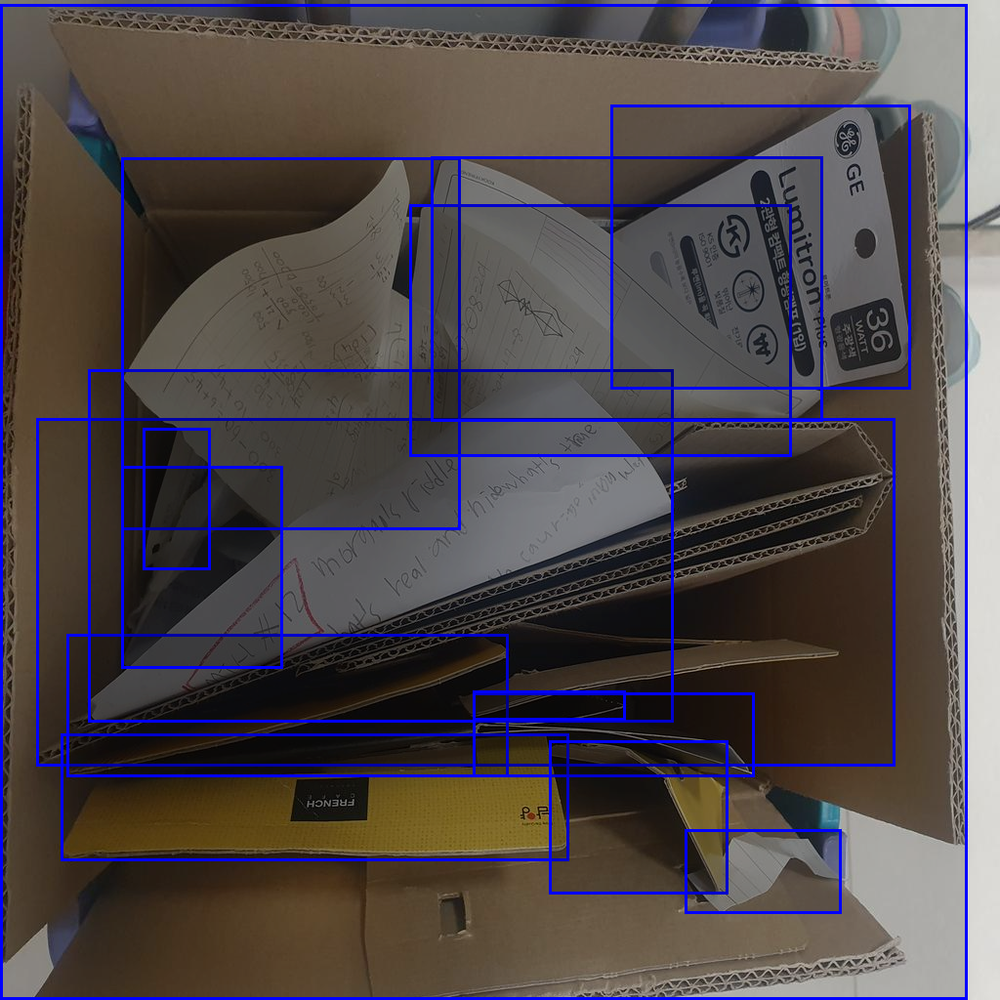

In [26]:
# area가 1,000,000보다 큰 bbox를 가진 이미지 시각화
draw_bbox(802, 500, 100000, True)

In [27]:
# Category별 bbox의 평균 크기를 확인
avg_area = pd.concat([pd.DataFrame({'Categories': class_name}), 
                      ann_df.groupby('category_id')['area'].mean()], axis=1)

avg_area.sort_values(by='area', ascending=False, inplace=True)
avg_area

,Categories,area
9,Clothing,189349.355983
7,Plastic bag,110357.698233
6,Styrofoam,97589.452375
1,Paper,92044.196322
3,Metal,91644.378526
5,Plastic,80990.612409
0,General trash,78860.147368
2,Paper pack,76116.495072
4,Glass,69338.117495
8,Battery,50409.963711


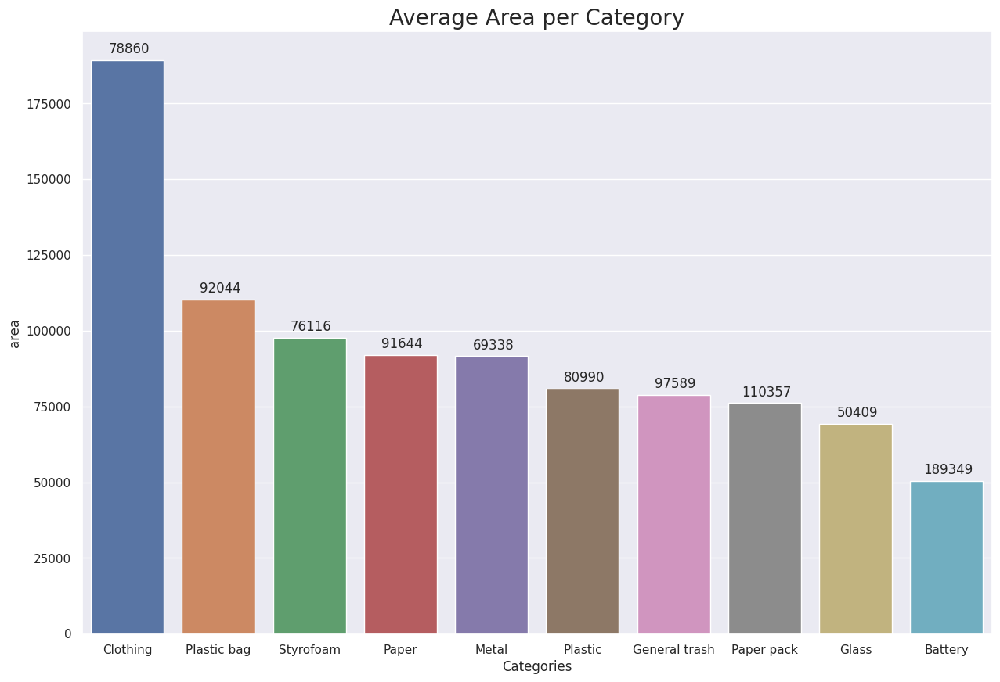

In [28]:
# 각 카테고리별로 bbox의 평균 넓이를 시각화
fig, ax = plt.subplots(figsize=(15,10))

barplot = sns.barplot(x='Categories', y='area', data=avg_area)
barplot.set_title('Average Area per Category', fontsize=20)

for i, p in enumerate(barplot.patches):
    barplot.annotate(int(avg_area['area'][i]), 
                      (p.get_x() + 0.3, p.get_y()+p.get_height()), 
                      ha='center', 
                      va='center', 
                      xytext=(10, 10), 
                      textcoords='offset points')

In [29]:
LABEL_COLORS = [px.colors.label_rgb(px.colors.convert_to_RGB_255(x)) for x in sns.color_palette("Spectral", 10)]
LABEL_COLORS_WOUT_NO_FINDING = LABEL_COLORS[:8]+LABEL_COLORS[9:]

coco = COCO(root + "train.json")

train_df = pd.DataFrame()

image_ids = []
class_name = []
class_id = []
x_min = []
y_min = []
x_max = []
y_max = []
classes = ["General trash", "Paper", "Paper pack", "Metal", "Glass", 
           "Plastic", "Styrofoam", "Plastic bag", "Battery", "Clothing"]
for image_id in coco.getImgIds():
        
    image_info = coco.loadImgs(image_id)[0]
    ann_ids = coco.getAnnIds(imgIds=image_info['id'])
    anns = coco.loadAnns(ann_ids)
        
    file_name = image_info['file_name']
        
    for ann in anns:
        image_ids.append(file_name)
        class_name.append(classes[ann['category_id']])
        class_id.append(ann['category_id'])
        x_min.append(float(ann['bbox'][0]))
        y_min.append(float(ann['bbox'][1]))
        x_max.append(float(ann['bbox'][0]) + float(ann['bbox'][2]))
        y_max.append(float(ann['bbox'][1]) + float(ann['bbox'][3]))

train_df['image_id'] = image_ids
train_df['class_name'] = class_name
train_df['class_id'] = class_id
train_df['x_min'] = x_min
train_df['y_min'] = y_min
train_df['x_max'] = x_max
train_df['y_max'] = y_max

loading annotations into memory...
Done (t=0.08s)
creating index...
index created!


In [30]:
# 한 이미지에 존재하는 유니크한 카테고리 개수 시각화
fig = px.histogram(train_df.groupby('image_id')["class_id"].unique().apply(lambda x: len(x)), 
             log_y=True, color_discrete_sequence=['skyblue'], opacity=0.7,
             labels={"value":"Number of Unique class"},
             title="<b>DISTRIBUTION OF # OF Unique Class PER IMAGE   " \
                   "<i><sub>(Log Scale for Y-Axis)</sub></i></b>",
                   )
fig.update_layout(showlegend=False,
                  xaxis_title="<b>Number of Unique CLASS</b>",
                  yaxis_title="<b>Count of Unique IMAGE</b>",)
fig.show()

  0%|          | 0/23144 [00:00<?, ?it/s]

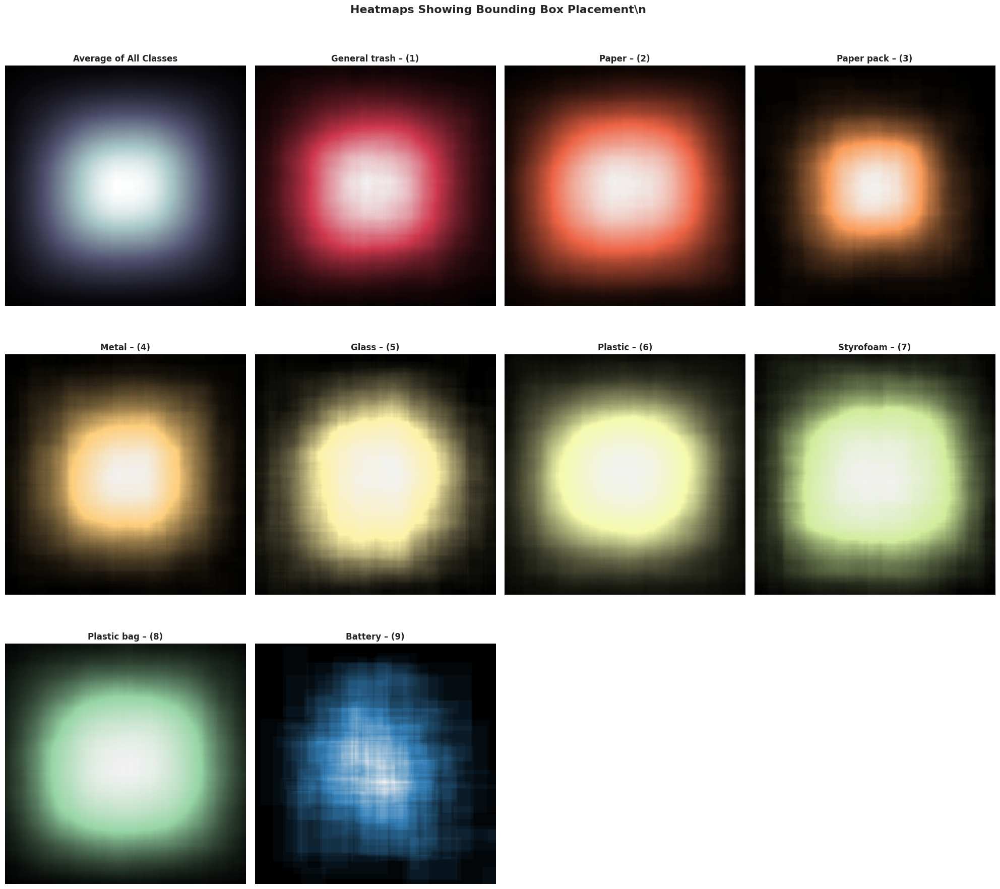

In [31]:
# 이미지에서 bbox가 주로 위치하는 부분을 시각화
bbox_df = pd.DataFrame()
bbox_df['class_id'] = train_df['class_id'].values
bbox_df['class_name'] = train_df['class_name'].values
bbox_df['x_min'] = train_df['x_min'].values / 1024
bbox_df['x_max'] = train_df['x_max'].values / 1024
bbox_df['y_min'] = train_df['y_min'].values / 1024
bbox_df['y_max'] = train_df['y_max'].values / 1024
bbox_df['frac_x_min'] = train_df['x_min'].values / 1024
bbox_df['frac_x_max'] = train_df['x_max'].values / 1024
bbox_df['frac_y_min'] = train_df['y_min'].values / 1024
bbox_df['frac_y_max'] = train_df['y_max'].values / 1024

ave_src_img_height = 1024
ave_src_img_width = 1024

# DEFAULT
HEATMAP_SIZE = (ave_src_img_height, ave_src_img_width, 14)

# Initialize
heatmap = np.zeros((HEATMAP_SIZE), dtype=np.int16)
bbox_np = bbox_df[["class_id", "frac_x_min", "frac_x_max", "frac_y_min", "frac_y_max"]].to_numpy()
bbox_np[:, 1:3] *= ave_src_img_width
bbox_np[:, 3:5] *= ave_src_img_height
bbox_np = np.floor(bbox_np).astype(np.int16)

# Color map stuff
custom_cmaps = [
    matplotlib.colors.LinearSegmentedColormap.from_list(
        colors=[(0.,0.,0.), c, (0.95,0.95,0.95)], 
        name=f"custom_{i}") for i,c in enumerate(sns.color_palette("Spectral", 10))
]
custom_cmaps.pop(8) # Remove No-Finding

for row in tqdm(bbox_np, total=bbox_np.shape[0]):
    heatmap[row[3]:row[4]+1, row[1]:row[2]+1, row[0]] += 1
    
fig = plt.figure(figsize=(20,25))
plt.suptitle("Heatmaps Showing Bounding Box Placement\\n ", fontweight="bold", fontsize=16)
for i in range(10):
    plt.subplot(4, 4, i+1)
    if i==0:
        plt.imshow(heatmap.mean(axis=-1), cmap="bone")
        plt.title(f"Average of All Classes", fontweight="bold")
    else:
        plt.imshow(heatmap[:, :, i-1], cmap=custom_cmaps[i-1])
        plt.title(f"{classes[i-1]} – ({i})", fontweight="bold")
        
    plt.axis(False)
fig.tight_layout(rect=[0, 0.03, 1, 0.97])
plt.show()

In [32]:
# 카테고리 별 bbox의 aspect ratio 값

# Aspect Ratio is Calculated as Width/Height
bbox_df["aspect_ratio"] = (bbox_df["x_max"]-bbox_df["x_min"])/(bbox_df["y_max"]-bbox_df["y_min"])

# Display average means for each class_id so we can examine the newly created Aspect Ratio Column
display(bbox_df.groupby("class_id").mean())

# Generate the bar plot
fig = px.bar(x=classes, y=bbox_df.groupby("class_id").mean()["aspect_ratio"], 
             color=classes, opacity=0.85,
             color_discrete_sequence=LABEL_COLORS_WOUT_NO_FINDING, 
             labels={"x":"Class Name", "y":"Aspect Ratio (W/H)"},
             title="<b>Aspect Ratios For Bounding Boxes By Class</b>",)
fig.update_layout(
                  yaxis_title="<b>Aspect Ratio (W/H)</b>",
                  xaxis_title=None,
                  legend_title_text=None)
fig.add_hline(y=1, line_width=2, line_dash="dot", 
              annotation_font_size=10, 
              annotation_text="<b>SQUARE ASPECT RATIO</b>", 
              annotation_position="bottom left", 
              annotation_font_color="black")
fig.add_hrect(y0=0, y1=0.5, line_width=0, fillcolor="red", opacity=0.125,
              annotation_text="<b>>2:1 VERTICAL RECTANGLE REGION</b>", 
              annotation_position="bottom right", 
              annotation_font_size=10,
              annotation_font_color="red")
fig.add_hrect(y0=2, y1=3.5, line_width=0, fillcolor="green", opacity=0.04,
              annotation_text="<b>>2:1 HORIZONTAL RECTANGLE REGION</b>", 
              annotation_position="top right", 
              annotation_font_size=10,
              annotation_font_color="green")
fig.show()

,x_min,x_max,y_min,y_max,frac_x_min,frac_x_max,frac_y_min,frac_y_max,aspect_ratio
class_id,,,,,,,,,
0,0.383549,0.604483,0.394808,0.605228,0.383549,0.604483,0.394808,0.605228,1.433186
1,0.375895,0.633562,0.375408,0.606554,0.375895,0.633562,0.375408,0.606554,1.391648
2,0.378863,0.618020,0.408042,0.622968,0.378863,0.618020,0.408042,0.622968,1.296333
3,0.387037,0.632183,0.368833,0.620011,0.387037,0.632183,0.368833,0.620011,1.239462
4,0.401057,0.602315,0.388950,0.654449,0.401057,0.602315,0.388950,0.654449,1.043987
5,0.391260,0.625025,0.386217,0.611491,0.391260,0.625025,0.386217,0.611491,1.288092
6,0.352261,0.644397,0.368552,0.614946,0.352261,0.644397,0.368552,0.614946,1.474087
7,0.368910,0.637833,0.341409,0.635559,0.368910,0.637833,0.341409,0.635559,1.106761
8,0.401370,0.624880,0.422020,0.631976,0.401370,0.624880,0.422020,0.631976,1.428327
